# PixNerd T2I (heavy decoder) class-conditioned trainingSelf-contained notebook that reuses the text-to-image heavy decoder with flow-matching on ImageNet-style folders, but replaces text conditioning with learnable class embeddings.

In [1]:
cd ..

/pscratch/sd/k/kevinval/PixNerd


/pscratch/sd/k/kevinval/envs/pixnerd/lib/python3.10/site-packages/IPython/core/magics/osm.py:417: UserWarning: This is now an optional IPython functionality, setting dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


In [2]:
import os
import torch
import torch._inductor.config as inductor_config

# Turn off problematic Triton persistent reductions
inductor_config.triton.persistent_reductions = False
os.environ["TORCHINDUCTOR_PERSISTENT_REDUCTIONS"] = "0"

In [9]:
import os
import math
import json
import random
import pathlib
import itertools

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader
from torchvision.utils import make_grid

import torchvision
from torchvision import transforms, datasets

import lightning.pytorch as pl
from lightning.pytorch.callbacks import ModelCheckpoint
from lightning.pytorch.loggers import CSVLogger

from src.models.autoencoder.pixel import PixelAE
from src.models.transformer.pixnerd_t2i_heavydecoder import PixNerDiT
from src.diffusion.flow_matching.scheduling import LinearScheduler
from src.diffusion.flow_matching.adam_sampling import AdamLMSampler, ode_step_fn
from src.diffusion.base.guidance import simple_guidance_fn
from src.diffusion.flow_matching.training_repa import REPATrainer
from src.callbacks.simple_ema import SimpleEMA
from src.lightning_model import LightningModel
from src.models.encoder import IndentityMapping
from src.models.autoencoder.base import fp2uint8
from src.models.conditioner.base import BaseConditioner

pl.seed_everything(42)
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')


# Paths and hyperparameters
DATA_ROOT = '/pscratch/sd/k/kevinval/datasets/imagenet256'
BATCH_SIZE = 32
NUM_WORKERS = 8
IMAGE_SIZE = 128
MAX_EPOCHS = 1  # change as needed
PRECISION = 'bf16' if torch.cuda.is_available() else 32

# Model hyperparameters (mirroring configs_t2i/inference_heavydecoder.yaml)
HIDDEN_SIZE = 1536
TXT_EMBED_DIM = 2048
PATCH_SIZE = 16
TXT_MAX_LENGTH = 128

LOG_DIR = 'logs/pixnerd_t2i_notext'
CKPT_DIR = os.path.join(LOG_DIR, 'checkpoints')
os.makedirs(CKPT_DIR, exist_ok=True)


# Datasets and loaders with metadata for REPA feature alignment
transform_raw = transforms.Compose([
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
    transforms.ToTensor(),
])

transform = transforms.Compose([
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5],
                         std=[0.5, 0.5, 0.5]),
])


class ImageFolderWithMetadata(datasets.ImageFolder):
    def __getitem__(self, index):
        path, target = self.samples[index]
        img = self.loader(path)

        raw_tensor = transform_raw(img)
        img_tensor = transform(img)

        metadata = {"raw_image": raw_tensor}
        return img_tensor, target, metadata


train_dataset = ImageFolderWithMetadata(DATA_ROOT)
val_dataset = ImageFolderWithMetadata(DATA_ROOT)

NUM_CLASSES = len(train_dataset.classes)

train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=NUM_WORKERS,
    pin_memory=True,
)

val_loader = DataLoader(
    val_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=True,
)


# Conditioning: replace text with learned class token embeddings
# but keep the same interface
class LabelTokenConditioner(BaseConditioner):
    def __init__(self, num_classes: int, embed_dim: int, max_length: int = 128):
        super().__init__()
        self.embed = nn.Embedding(num_classes, embed_dim)
        self.max_length = max_length
        self.register_buffer(
            'uncond',
            torch.zeros(1, max_length, embed_dim),
            persistent=False,
        )

    def _impl_condition(self, y, metadata=None):
        tokens = self.embed(y.to(self.embed.weight.device))  # (B, embed_dim)
        tokens = tokens.unsqueeze(1)
        # repeat to max_length so positional embeddings stay aligned
        # with the heavy decoder
        return tokens.repeat(1, self.max_length, 1)

    def _impl_uncondition(self, y, metadata=None):
        b = y.shape[0]
        return self.uncond.repeat(b, 1, 1)


# Lightweight vision encoder for REPA feature alignment
class SimpleVisionEncoder(nn.Module):
    def __init__(self, proj_dim: int):
        super().__init__()
        self.backbone = nn.Sequential(
            nn.Conv2d(3, 64, 3, stride=2, padding=1),
            nn.SiLU(),
            nn.Conv2d(64, 128, 3, stride=2, padding=1),
            nn.SiLU(),
            nn.Conv2d(128, 256, 3, stride=2, padding=1),
            nn.SiLU(),
            nn.AdaptiveAvgPool2d(1),
        )
        self.proj = nn.Linear(256, proj_dim)

    def forward(self, x):
        feat = self.backbone(x)
        feat = feat.flatten(1)
        feat = self.proj(feat)
        return feat.unsqueeze(1)  # (B, 1, proj_dim)


# Instantiate model components
main_scheduler = LinearScheduler()

vae = PixelAE(scale=1.0)

conditioner = LabelTokenConditioner(
    num_classes=NUM_CLASSES,
    embed_dim=TXT_EMBED_DIM,
    max_length=TXT_MAX_LENGTH,
)

# heavy decoder DiT
denoiser = PixNerDiT(
    in_channels=3,
    patch_size=PATCH_SIZE,
    num_groups=24,
    hidden_size=HIDDEN_SIZE,
    txt_embed_dim=TXT_EMBED_DIM,
    txt_max_length=TXT_MAX_LENGTH,
    num_text_blocks=4,
    decoder_hidden_size=64,
    num_encoder_blocks=16,
    num_decoder_blocks=2,
)

sampler = AdamLMSampler(
    num_steps=25,
    guidance=4.0,
    timeshift=3.0,
    order=2,
    scheduler=main_scheduler,
    guidance_fn=simple_guidance_fn,
    step_fn=ode_step_fn,
)

trainer_core = REPATrainer(
    scheduler=main_scheduler,
    lognorm_t=True,
    timeshift=4.0,
    feat_loss_weight=0.5,
    encoder=SimpleVisionEncoder(proj_dim=768),
    align_layer=6,
    proj_denoiser_dim=HIDDEN_SIZE,
    proj_hidden_dim=HIDDEN_SIZE,
    proj_encoder_dim=768,
)

ema_tracker = SimpleEMA(decay=0.9999)

# optimizer callable for LightningModel
optimizer_fn = lambda params: torch.optim.AdamW(
    params,
    lr=2e-4,
    betas=(0.9, 0.99),
)

model = LightningModel(
    vae=vae,
    conditioner=conditioner,
    denoiser=denoiser,
    diffusion_trainer=trainer_core,
    diffusion_sampler=sampler,
    ema_tracker=ema_tracker,
    optimizer=optimizer_fn,
    lr_scheduler=None,
    eval_original_model=False,
)


# Training
logger = CSVLogger(save_dir=LOG_DIR, name='pixnerd_t2i_notext')

ckpt_cb = ModelCheckpoint(
    dirpath=CKPT_DIR,
    save_top_k=1,
    monitor='loss',
    mode='min',
)

trainer = pl.Trainer(
    max_epochs=MAX_EPOCHS,
    precision=PRECISION,
    accelerator='gpu' if torch.cuda.is_available() else 'cpu',
    devices=1,
    callbacks=[ckpt_cb],
    logger=logger,
)

trainer.fit(
    model,
    train_dataloaders=train_loader,
    val_dataloaders=val_loader,
)


# Sampling and (optional) super-resolution decoding
import matplotlib.pyplot as plt
from torchvision.utils import make_grid

# set decoder patch scaling >1.0 to upsample at inference
upscale = 2.0  # change to 1.0 for base resolution
model.denoiser.decoder_patch_scaling_h = upscale
model.denoiser.decoder_patch_scaling_w = upscale

model.eval()
with torch.no_grad():
    batch = next(iter(val_loader))
    x, y, metadata = batch

    xT = torch.randn_like(x)

    condition, uncondition = model.conditioner(y, metadata)
    samples = model.diffusion_sampler(
        model.ema_denoiser,
        xT.to(DEVICE),
        condition.to(DEVICE),
        uncondition.to(DEVICE),
    )

    imgs = model.vae.decode(samples).cpu()
    imgs_uint8 = fp2uint8(imgs)

    grid = make_grid(imgs_uint8, nrow=4)
    plt.figure(figsize=(8, 8))
    plt.axis('off')
    plt.imshow(grid.permute(1, 2, 0))
    plt.show()


[rank: 0] Seed set to 42


KeyboardInterrupt: 

In [4]:
upscale = 2.0  # change to 1.0 for base resolution
model.denoiser.decoder_patch_scaling_h = upscale
model.denoiser.decoder_patch_scaling_w = upscale

model.eval()
with torch.no_grad():
    batch = next(iter(val_loader))
    x, y, metadata = batch

    xT = torch.randn_like(x)

    condition, uncondition = model.conditioner(y, metadata)
    samples = model.diffusion_sampler(
        model.ema_denoiser,
        xT.to(DEVICE),
        condition.to(DEVICE),
        uncondition.to(DEVICE),
    )

    imgs = model.vae.decode(samples).cpu()
    imgs_uint8 = fp2uint8(imgs)

    grid = make_grid(imgs_uint8, nrow=4)
    plt.figure(figsize=(8, 8))
    plt.axis('off')
    plt.imshow(grid.permute(1, 2, 0))
    plt.show()

NameError: name 'make_grid' is not defined

[rank: 0] Seed set to 42


Device: cuda
Files already downloaded and verified
Files already downloaded and verified
CIFAR-10 train size: 50000
CIFAR-10 val size: 10000
Num classes: 10


/pscratch/sd/k/kevinval/envs/pixnerd/lib/python3.10/site-packages/lightning/fabric/connector.py:572: `precision=bf16` is supported for historical reasons but its usage is discouraged. Please set your precision to bf16-mixed instead!
Using bfloat16 Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/pscratch/sd/k/kevinval/envs/pixnerd/lib/python3.10/site-packages/lightning/pytorch/callbacks/model_checkpoint.py:654: Checkpoint directory /pscratch/sd/k/kevinval/PixNerd/logs/pixnerd_t2i_cifar10_small/checkpoints exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]

  | Name              | Type                  | Params | Mode 
--------------------------------------------------------------------
0 | vae               | PixelAE               | 0      | eval 
1 | conditioner       | LabelTokenConditioner | 5.1 K  | eval 
2 | denoiser          | PixNerDiT             | 184 M  | 

Epoch 0: 100%|██████████| 391/391 [00:32<00:00, 11.89it/s, v_num=2, fm_loss=0.179, cos_loss=0.000823, loss=0.179]
idation: |          | 0/? [00:00<?, ?it/s]
Epoch 0: 100%|██████████| 391/391 [02:01<00:00,  3.22it/s, v_num=2, fm_loss=0.179, cos_loss=0.000823, loss=0.179]

W1129 09:32:23.974000 907726 site-packages/torch/_dynamo/convert_frame.py:844] [0/8] torch._dynamo hit config.cache_size_limit (8)
W1129 09:32:23.974000 907726 site-packages/torch/_dynamo/convert_frame.py:844] [0/8]    function: 'forward' (/pscratch/sd/k/kevinval/PixNerd/src/models/transformer/pixnerd_t2i_heavydecoder.py:276)
W1129 09:32:23.974000 907726 site-packages/torch/_dynamo/convert_frame.py:844] [0/8]    last reason: 0/0: not L['self'].precompute_pos                                
W1129 09:32:23.974000 907726 site-packages/torch/_dynamo/convert_frame.py:844] [0/8] To log all recompilation reasons, use TORCH_LOGS="recompiles".
W1129 09:32:23.974000 907726 site-packages/torch/_dynamo/convert_frame.py:844] [0/8] To diagnose recompilation issues, see https://pytorch.org/docs/main/torch.compiler_troubleshooting.html.


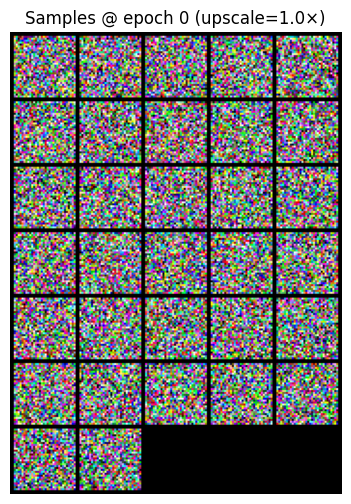

Epoch 1: 100%|██████████| 391/391 [01:16<00:00,  5.13it/s, v_num=2, fm_loss=0.174, cos_loss=0.000424, loss=0.175]
idation: |          | 0/? [00:00<?, ?it/s]
Epoch 2: 100%|██████████| 391/391 [01:16<00:00,  5.10it/s, v_num=2, fm_loss=0.178, cos_loss=0.000338, loss=0.178]
idation: |          | 0/? [00:00<?, ?it/s]
Epoch 3: 100%|██████████| 391/391 [01:16<00:00,  5.12it/s, v_num=2, fm_loss=0.169, cos_loss=0.00031, loss=0.169] 
idation: |          | 0/? [00:00<?, ?it/s]
Epoch 4: 100%|██████████| 391/391 [01:16<00:00,  5.12it/s, v_num=2, fm_loss=0.170, cos_loss=0.000348, loss=0.170]
idation: |          | 0/? [00:00<?, ?it/s]
Epoch 5: 100%|██████████| 391/391 [01:16<00:00,  5.13it/s, v_num=2, fm_loss=0.178, cos_loss=0.000245, loss=0.178]
idation: |          | 0/? [00:00<?, ?it/s]
Epoch 5: 100%|██████████| 391/391 [04:02<00:00,  1.61it/s, v_num=2, fm_loss=0.178, cos_loss=0.000245, loss=0.178]

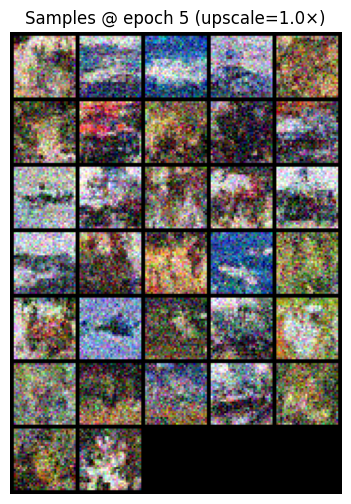

Epoch 6: 100%|██████████| 391/391 [01:16<00:00,  5.12it/s, v_num=2, fm_loss=0.172, cos_loss=0.000292, loss=0.172]
idation: |          | 0/? [00:00<?, ?it/s]
Epoch 3:  12%|█▏        | 48/391 [37:34<4:28:27,  0.02it/s, v_num=1, fm_loss=0.168, cos_loss=0.000362, loss=0.168]

Epoch 7: 100%|██████████| 391/391 [01:23<00:00,  4.68it/s, v_num=2, fm_loss=0.170, cos_loss=0.000324, loss=0.170]
idation: |          | 0/? [00:00<?, ?it/s]
Epoch 8: 100%|██████████| 391/391 [01:16<00:00,  5.12it/s, v_num=2, fm_loss=0.180, cos_loss=0.000352, loss=0.180]
idation: |          | 0/? [00:00<?, ?it/s]
Epoch 9: 100%|██████████| 391/391 [01:16<00:00,  5.12it/s, v_num=2, fm_loss=0.165, cos_loss=0.000304, loss=0.165]
idation: |          | 0/? [00:00<?, ?it/s]
Epoch 10: 100%|██████████| 391/391 [01:16<00:00,  5.11it/s, v_num=2, fm_loss=0.165, cos_loss=0.000285, loss=0.165]
idation: |          | 0/? [00:00<?, ?it/s]
Epoch 10: 100%|██████████| 391/391 [04:03<00:00,  1.61it/s, v_num=2, fm_loss=0.165, cos_loss=0.000

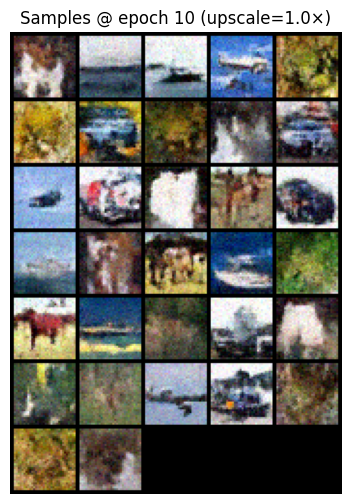

Epoch 11: 100%|██████████| 391/391 [01:16<00:00,  5.13it/s, v_num=2, fm_loss=0.165, cos_loss=0.000333, loss=0.165]
idation: |          | 0/? [00:00<?, ?it/s]
Epoch 12: 100%|██████████| 391/391 [01:16<00:00,  5.12it/s, v_num=2, fm_loss=0.172, cos_loss=0.00034, loss=0.173] 
idation: |          | 0/? [00:00<?, ?it/s]
Epoch 13: 100%|██████████| 391/391 [01:16<00:00,  5.12it/s, v_num=2, fm_loss=0.154, cos_loss=0.000228, loss=0.154]
idation: |          | 0/? [00:00<?, ?it/s]
Epoch 14: 100%|██████████| 391/391 [01:16<00:00,  5.11it/s, v_num=2, fm_loss=0.160, cos_loss=0.000273, loss=0.160]
idation: |          | 0/? [00:00<?, ?it/s]
Epoch 15: 100%|██████████| 391/391 [01:16<00:00,  5.12it/s, v_num=2, fm_loss=0.189, cos_loss=0.000344, loss=0.190]
idation: |          | 0/? [00:00<?, ?it/s]
Epoch 15: 100%|██████████| 391/391 [04:03<00:00,  1.61it/s, v_num=2, fm_loss=0.189, cos_loss=0.000344, loss=0.190]

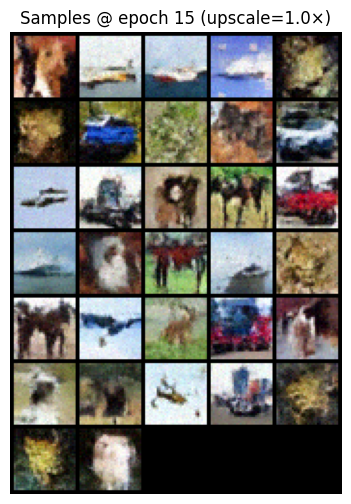

Epoch 16: 100%|██████████| 391/391 [01:16<00:00,  5.11it/s, v_num=2, fm_loss=0.160, cos_loss=0.000273, loss=0.160]
idation: |          | 0/? [00:00<?, ?it/s]
Epoch 17: 100%|██████████| 391/391 [01:16<00:00,  5.09it/s, v_num=2, fm_loss=0.155, cos_loss=0.000259, loss=0.155]
idation: |          | 0/? [00:00<?, ?it/s]
Epoch 18: 100%|██████████| 391/391 [01:16<00:00,  5.12it/s, v_num=2, fm_loss=0.185, cos_loss=0.000318, loss=0.185]
idation: |          | 0/? [00:00<?, ?it/s]
Epoch 19: 100%|██████████| 391/391 [01:16<00:00,  5.13it/s, v_num=2, fm_loss=0.167, cos_loss=0.000263, loss=0.167]
idation: |          | 0/? [00:00<?, ?it/s]
Epoch 20: 100%|██████████| 391/391 [01:16<00:00,  5.11it/s, v_num=2, fm_loss=0.168, cos_loss=0.000269, loss=0.168]
idation: |          | 0/? [00:00<?, ?it/s]
Epoch 20: 100%|██████████| 391/391 [04:03<00:00,  1.61it/s, v_num=2, fm_loss=0.168, cos_loss=0.000269, loss=0.168]

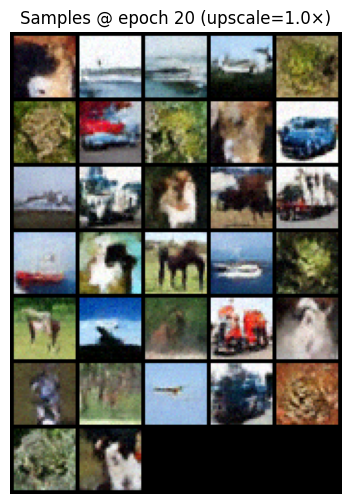

Epoch 21: 100%|██████████| 391/391 [01:16<00:00,  5.12it/s, v_num=2, fm_loss=0.163, cos_loss=0.000249, loss=0.163]
idation: |          | 0/? [00:00<?, ?it/s]
Epoch 22: 100%|██████████| 391/391 [01:16<00:00,  5.12it/s, v_num=2, fm_loss=0.160, cos_loss=0.000302, loss=0.161]
idation: |          | 0/? [00:00<?, ?it/s]
Epoch 23: 100%|██████████| 391/391 [01:16<00:00,  5.11it/s, v_num=2, fm_loss=0.165, cos_loss=0.000278, loss=0.165]
idation: |          | 0/? [00:00<?, ?it/s]
Epoch 24: 100%|██████████| 391/391 [01:16<00:00,  5.11it/s, v_num=2, fm_loss=0.170, cos_loss=0.000312, loss=0.171]
idation: |          | 0/? [00:00<?, ?it/s]
Epoch 25: 100%|██████████| 391/391 [01:16<00:00,  5.12it/s, v_num=2, fm_loss=0.174, cos_loss=0.000285, loss=0.175]
idation: |          | 0/? [00:00<?, ?it/s]
Epoch 25: 100%|██████████| 391/391 [04:03<00:00,  1.61it/s, v_num=2, fm_loss=0.174, cos_loss=0.000285, loss=0.175]

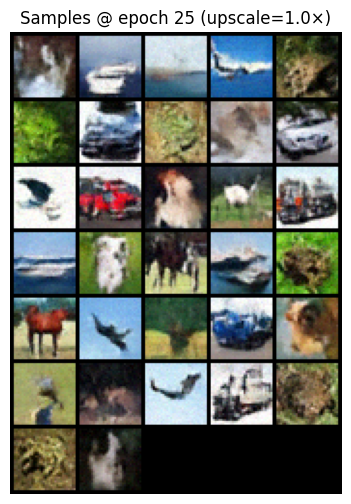

Epoch 26: 100%|██████████| 391/391 [01:16<00:00,  5.11it/s, v_num=2, fm_loss=0.171, cos_loss=0.00034, loss=0.171] 
idation: |          | 0/? [00:00<?, ?it/s]
Epoch 27: 100%|██████████| 391/391 [01:16<00:00,  5.11it/s, v_num=2, fm_loss=0.161, cos_loss=0.000261, loss=0.161]
idation: |          | 0/? [00:00<?, ?it/s]
Epoch 28: 100%|██████████| 391/391 [01:16<00:00,  5.12it/s, v_num=2, fm_loss=0.179, cos_loss=0.000288, loss=0.179]
idation: |          | 0/? [00:00<?, ?it/s]
Epoch 29: 100%|██████████| 391/391 [01:16<00:00,  5.12it/s, v_num=2, fm_loss=0.170, cos_loss=0.000294, loss=0.170]
idation: |          | 0/? [00:00<?, ?it/s]
Epoch 30: 100%|██████████| 391/391 [01:16<00:00,  5.12it/s, v_num=2, fm_loss=0.155, cos_loss=0.00025, loss=0.155] 
idation: |          | 0/? [00:00<?, ?it/s]
Epoch 30: 100%|██████████| 391/391 [04:03<00:00,  1.61it/s, v_num=2, fm_loss=0.155, cos_loss=0.00025, loss=0.155]

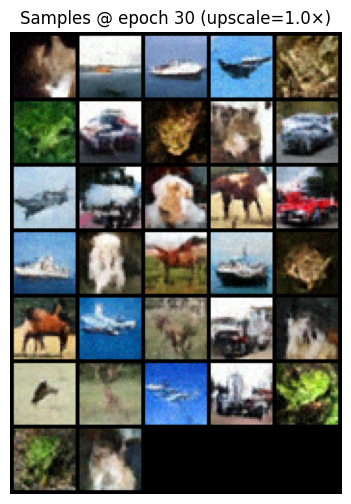

Epoch 31: 100%|██████████| 391/391 [01:16<00:00,  5.12it/s, v_num=2, fm_loss=0.155, cos_loss=0.000246, loss=0.155]
idation: |          | 0/? [00:00<?, ?it/s]
Epoch 32: 100%|██████████| 391/391 [01:16<00:00,  5.11it/s, v_num=2, fm_loss=0.170, cos_loss=0.000333, loss=0.170]
idation: |          | 0/? [00:00<?, ?it/s]
Epoch 33: 100%|██████████| 391/391 [01:16<00:00,  5.12it/s, v_num=2, fm_loss=0.172, cos_loss=0.000342, loss=0.172]
idation: |          | 0/? [00:00<?, ?it/s]
Epoch 34: 100%|██████████| 391/391 [01:16<00:00,  5.12it/s, v_num=2, fm_loss=0.157, cos_loss=0.000224, loss=0.157]
idation: |          | 0/? [00:00<?, ?it/s]
Epoch 35: 100%|██████████| 391/391 [01:16<00:00,  5.09it/s, v_num=2, fm_loss=0.169, cos_loss=0.000281, loss=0.169]
idation: |          | 0/? [00:00<?, ?it/s]
Epoch 35: 100%|██████████| 391/391 [04:03<00:00,  1.61it/s, v_num=2, fm_loss=0.169, cos_loss=0.000281, loss=0.169]

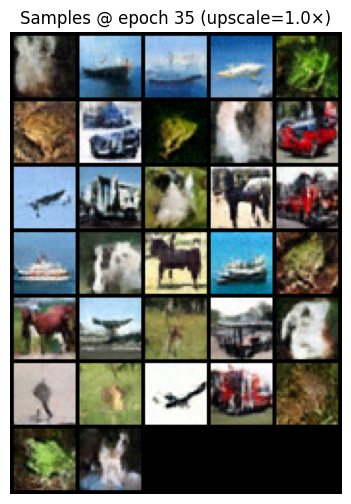

Epoch 36: 100%|██████████| 391/391 [01:16<00:00,  5.12it/s, v_num=2, fm_loss=0.161, cos_loss=0.000227, loss=0.161]
idation: |          | 0/? [00:00<?, ?it/s]
Epoch 37: 100%|██████████| 391/391 [01:16<00:00,  5.12it/s, v_num=2, fm_loss=0.145, cos_loss=0.000228, loss=0.146]
idation: |          | 0/? [00:00<?, ?it/s]
Epoch 38: 100%|██████████| 391/391 [01:16<00:00,  5.11it/s, v_num=2, fm_loss=0.161, cos_loss=0.000296, loss=0.161]
idation: |          | 0/? [00:00<?, ?it/s]
Epoch 39: 100%|██████████| 391/391 [01:16<00:00,  5.13it/s, v_num=2, fm_loss=0.172, cos_loss=0.000202, loss=0.172]
idation: |          | 0/? [00:00<?, ?it/s]
Epoch 40: 100%|██████████| 391/391 [01:16<00:00,  5.12it/s, v_num=2, fm_loss=0.163, cos_loss=0.000286, loss=0.163]
idation: |          | 0/? [00:00<?, ?it/s]
Epoch 40: 100%|██████████| 391/391 [04:03<00:00,  1.61it/s, v_num=2, fm_loss=0.163, cos_loss=0.000286, loss=0.163]

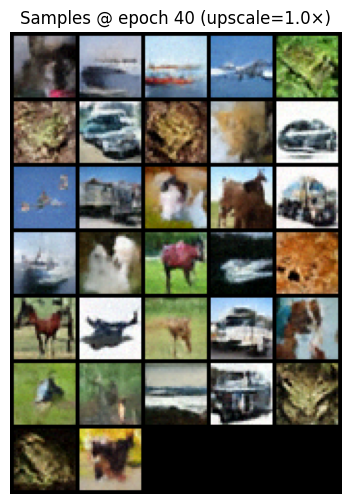

Epoch 41: 100%|██████████| 391/391 [01:16<00:00,  5.12it/s, v_num=2, fm_loss=0.166, cos_loss=0.000263, loss=0.167]
idation: |          | 0/? [00:00<?, ?it/s]
Epoch 42: 100%|██████████| 391/391 [01:16<00:00,  5.12it/s, v_num=2, fm_loss=0.162, cos_loss=0.00024, loss=0.162] 
idation: |          | 0/? [00:00<?, ?it/s]
Epoch 43: 100%|██████████| 391/391 [01:16<00:00,  5.12it/s, v_num=2, fm_loss=0.163, cos_loss=0.000279, loss=0.163]
idation: |          | 0/? [00:00<?, ?it/s]
Epoch 44: 100%|██████████| 391/391 [01:16<00:00,  5.12it/s, v_num=2, fm_loss=0.159, cos_loss=0.000244, loss=0.159]
idation: |          | 0/? [00:00<?, ?it/s]
Epoch 45: 100%|██████████| 391/391 [01:16<00:00,  5.10it/s, v_num=2, fm_loss=0.153, cos_loss=0.000234, loss=0.153]
idation: |          | 0/? [00:00<?, ?it/s]
Epoch 45: 100%|██████████| 391/391 [04:03<00:00,  1.60it/s, v_num=2, fm_loss=0.153, cos_loss=0.000234, loss=0.153]

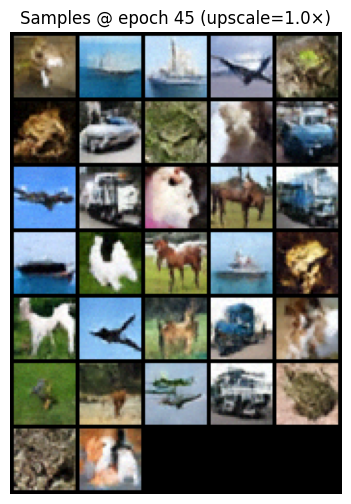

Epoch 46: 100%|██████████| 391/391 [01:16<00:00,  5.10it/s, v_num=2, fm_loss=0.157, cos_loss=0.000269, loss=0.157]
idation: |          | 0/? [00:00<?, ?it/s]
Epoch 47: 100%|██████████| 391/391 [01:16<00:00,  5.08it/s, v_num=2, fm_loss=0.158, cos_loss=0.000247, loss=0.158]
idation: |          | 0/? [00:00<?, ?it/s]
Epoch 48: 100%|██████████| 391/391 [01:16<00:00,  5.12it/s, v_num=2, fm_loss=0.163, cos_loss=0.000291, loss=0.163]
idation: |          | 0/? [00:00<?, ?it/s]
Epoch 49: 100%|██████████| 391/391 [01:16<00:00,  5.12it/s, v_num=2, fm_loss=0.163, cos_loss=0.000254, loss=0.163]
idation: |          | 0/? [00:00<?, ?it/s]
Epoch 49: 100%|██████████| 391/391 [04:03<00:00,  1.61it/s, v_num=2, fm_loss=0.163, cos_loss=0.000254, loss=0.163]

`Trainer.fit` stopped: `max_epochs=50` reached.


Epoch 49: 100%|██████████| 391/391 [04:03<00:00,  1.61it/s, v_num=2, fm_loss=0.163, cos_loss=0.000254, loss=0.163]


RuntimeError: mat1 and mat2 must have the same dtype, but got BFloat16 and Float

In [14]:
# ============================================================
# Small PixNerd-style Flow-Matching on CIFAR-10 (32×32)
#  - PixelAE + PixNerDiT + REPA + AdamLMSampler
#  - Periodic visualization during training at base 32×32
#  - Final super-res sampling after training (e.g., 64×64)
# ============================================================

import os
import math
import json
import random
import pathlib
import itertools

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader

import torchvision
from torchvision import transforms, datasets
from torchvision.utils import make_grid

from PIL import Image
import matplotlib.pyplot as plt

import lightning.pytorch as pl
from lightning.pytorch.callbacks import ModelCheckpoint
from lightning.pytorch.loggers import CSVLogger
from lightning.pytorch.callbacks import Callback

from src.models.autoencoder.pixel import PixelAE
from src.models.transformer.pixnerd_t2i_heavydecoder import PixNerDiT
from src.diffusion.flow_matching.scheduling import LinearScheduler
from src.diffusion.flow_matching.adam_sampling import AdamLMSampler, ode_step_fn
from src.diffusion.base.guidance import simple_guidance_fn
from src.diffusion.flow_matching.training_repa import REPATrainer
from src.callbacks.simple_ema import SimpleEMA
from src.lightning_model import LightningModel
from src.models.autoencoder.base import fp2uint8
from src.models.conditioner.base import BaseConditioner

pl.seed_everything(42)
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print("Device:", DEVICE)

# ============================================================
# Paths and hyperparameters (CIFAR-10)
# ============================================================

DATA_ROOT   = "/pscratch/sd/k/kevinval/datasets/cifar10"  # or "./data"
BATCH_SIZE  = 128
NUM_WORKERS = 8
IMAGE_SIZE  = 32
MAX_EPOCHS  = 50
PRECISION   = "bf16" if torch.cuda.is_available() else 32

# ---- Small model hyperparams ----
HIDDEN_SIZE    = 512      # main DiT width
TXT_EMBED_DIM  = 512      # class token dim
PATCH_SIZE     = 4        # 32/4 -> 8×8 tokens
TXT_MAX_LENGTH = 16       # short token sequence

LOG_DIR  = "logs/pixnerd_t2i_cifar10_small"
CKPT_DIR = os.path.join(LOG_DIR, "checkpoints")
os.makedirs(CKPT_DIR, exist_ok=True)

# Visualization frequency (epochs)
VIS_EVERY_N_EPOCHS = 5
VIS_NUM_SAMPLES    = 32
VIS_UPSCALE        = 1.0   # keep 1.0 during training (base 32×32)

# ============================================================
# CIFAR-10 dataset with metadata (raw + normalized image)
# ============================================================

transform_raw = transforms.Compose([
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
    transforms.ToTensor(),                      # [0,1]
])

transform = transforms.Compose([
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5],  # map to [-1,1]
                         std=[0.5, 0.5, 0.5]),
])

class CIFAR10WithMetadata(datasets.CIFAR10):
    def __init__(self, root, train, transform_raw, transform, download=False):
        super().__init__(root=root, train=train, download=download)
        self.transform_raw = transform_raw
        self.transform     = transform

    def __getitem__(self, index):
        img, target = self.data[index], self.targets[index]
        img = Image.fromarray(img)

        raw_tensor = self.transform_raw(img)    # [3,32,32] in [0,1]
        img_tensor = self.transform(img)        # normalized [-1,1]

        metadata = {"raw_image": raw_tensor}
        return img_tensor, target, metadata

train_dataset = CIFAR10WithMetadata(
    root=DATA_ROOT,
    train=True,
    transform_raw=transform_raw,
    transform=transform,
    download=True,
)

val_dataset = CIFAR10WithMetadata(
    root=DATA_ROOT,
    train=False,
    transform_raw=transform_raw,
    transform=transform,
    download=True,
)

NUM_CLASSES = len(train_dataset.classes)

train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=NUM_WORKERS,
    pin_memory=True,
)

val_loader = DataLoader(
    val_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=True,
)

print("CIFAR-10 train size:", len(train_dataset))
print("CIFAR-10 val size:", len(val_dataset))
print("Num classes:", NUM_CLASSES)

# Grab one fixed batch for periodic visualization
vis_batch = next(iter(val_loader))   # (x, y, metadata)

# ============================================================
# Conditioning: class tokens instead of text, same interface
# ============================================================

class LabelTokenConditioner(BaseConditioner):
    def __init__(self, num_classes: int, embed_dim: int, max_length: int = 16):
        super().__init__()
        self.embed = nn.Embedding(num_classes, embed_dim)
        self.max_length = max_length
        self.register_buffer(
            "uncond",
            torch.zeros(1, max_length, embed_dim),
            persistent=False,
        )

    def _impl_condition(self, y, metadata=None):
        # y: (B,) int64
        tokens = self.embed(y.to(self.embed.weight.device))  # (B, D)
        tokens = tokens.unsqueeze(1)                         # (B, 1, D)
        return tokens.repeat(1, self.max_length, 1)          # (B, L, D)

    def _impl_uncondition(self, y, metadata=None):
        b = y.shape[0]
        return self.uncond.repeat(b, 1, 1)

# ============================================================
# Lightweight vision encoder for REPA feature alignment
# ============================================================

class SimpleVisionEncoder(nn.Module):
    def __init__(self, proj_dim: int):
        super().__init__()
        self.backbone = nn.Sequential(
            nn.Conv2d(3, 64, 3, stride=2, padding=1),  # 32 -> 16
            nn.SiLU(),
            nn.Conv2d(64, 128, 3, stride=2, padding=1), # 16 -> 8
            nn.SiLU(),
            nn.Conv2d(128, 256, 3, stride=2, padding=1),# 8 -> 4
            nn.SiLU(),
            nn.AdaptiveAvgPool2d(1),                   # 4 -> 1
        )
        self.proj = nn.Linear(256, proj_dim)

    def forward(self, x):
        feat = self.backbone(x)          # (B,256,1,1)
        feat = feat.flatten(1)           # (B,256)
        feat = self.proj(feat)           # (B,proj_dim)
        return feat.unsqueeze(1)         # (B,1,proj_dim)

# ============================================================
# Instantiate PixNerDiT + flow-matching trainer + sampler
# ============================================================

main_scheduler = LinearScheduler()

# PixelAE with scale=1.0 (pixel-space identity-ish VAE)
vae = PixelAE(scale=1.0)

conditioner = LabelTokenConditioner(
    num_classes=NUM_CLASSES,
    embed_dim=TXT_EMBED_DIM,
    max_length=TXT_MAX_LENGTH,
)

# Small heavy-decoder DiT
denoiser = PixNerDiT(
    in_channels=3,
    patch_size=PATCH_SIZE,      # 4 for 32×32; tokens ~ 8×8
    num_groups=16,              # must divide hidden_size
    hidden_size=HIDDEN_SIZE,    # 512
    txt_embed_dim=TXT_EMBED_DIM,
    txt_max_length=TXT_MAX_LENGTH,
    num_text_blocks=2,          # fewer text blocks
    decoder_hidden_size=256,    # smaller decoder MLP width
    num_encoder_blocks=6,       # fewer DiT blocks
    num_decoder_blocks=1,       # small NF decoder
)

sampler = AdamLMSampler(
    num_steps=25,
    guidance=3.0,
    timeshift=3.0,
    order=2,
    scheduler=main_scheduler,
    guidance_fn=simple_guidance_fn,
    step_fn=ode_step_fn,
)

trainer_core = REPATrainer(
    scheduler=main_scheduler,
    lognorm_t=True,
    timeshift=4.0,
    feat_loss_weight=0.5,
    encoder=SimpleVisionEncoder(proj_dim=HIDDEN_SIZE),
    align_layer=2,                 # earlier layer for small DiT
    proj_denoiser_dim=HIDDEN_SIZE,
    proj_hidden_dim=HIDDEN_SIZE,
    proj_encoder_dim=HIDDEN_SIZE,
)

ema_tracker = SimpleEMA(decay=0.999)

optimizer_fn = lambda params: torch.optim.AdamW(
    params,
    lr=2e-4,
    betas=(0.9, 0.99),
)

model = LightningModel(
    vae=vae,
    conditioner=conditioner,
    denoiser=denoiser,
    diffusion_trainer=trainer_core,
    diffusion_sampler=sampler,
    ema_tracker=ema_tracker,
    optimizer=optimizer_fn,
    lr_scheduler=None,
    eval_original_model=False,
)

# ============================================================
# Callback for periodic visualization during training
# ============================================================

class SampleVisualizationCallback(Callback):
    def __init__(self, vis_batch, every_n_epochs=5, num_samples=32, upscale=1.0):
        super().__init__()
        self.vis_x, self.vis_y, self.vis_metadata = vis_batch
        self.every_n_epochs = every_n_epochs
        self.num_samples = num_samples
        self.upscale = upscale

    def on_train_epoch_end(self, trainer, pl_module):
        # only run on main process
        if hasattr(trainer, "global_rank") and trainer.global_rank != 0:
            return

        epoch = trainer.current_epoch
        if epoch % self.every_n_epochs != 0:
            return

        pl_module.eval()
        device = next(pl_module.parameters()).device

        with torch.no_grad():
            x = self.vis_x[:self.num_samples].to(device)
            y = torch.as_tensor(self.vis_y[:self.num_samples], device=device)

            # metadata dict: move tensors to device (if needed)
            metadata = {}
            if isinstance(self.vis_metadata, dict):
                for k, v in self.vis_metadata.items():
                    metadata[k] = v[:self.num_samples].to(device)
            else:
                metadata = self.vis_metadata  # not used by conditioner anyway

            # base-res sampling during training
            pl_module.denoiser.decoder_patch_scaling_h = self.upscale
            pl_module.denoiser.decoder_patch_scaling_w = self.upscale

            xT = torch.randn_like(x)

            condition, uncondition = pl_module.conditioner(y, metadata)
            condition   = condition.to(device)
            uncondition = uncondition.to(device)

            samples = pl_module.diffusion_sampler(
                pl_module.ema_denoiser,
                xT,
                condition,
                uncondition,
            )

            imgs = pl_module.vae.decode(samples).cpu()
            imgs_uint8 = fp2uint8(imgs)

            nrow = int(math.sqrt(self.num_samples))
            grid = make_grid(imgs_uint8, nrow=nrow)

            plt.figure(figsize=(6, 6))
            plt.axis("off")
            plt.title(f"Samples @ epoch {epoch} (upscale={self.upscale}×)")
            plt.imshow(grid.permute(1, 2, 0))
            plt.show()

        pl_module.train()

vis_cb = SampleVisualizationCallback(
    vis_batch=vis_batch,
    every_n_epochs=VIS_EVERY_N_EPOCHS,
    num_samples=VIS_NUM_SAMPLES,
    upscale=VIS_UPSCALE,   # 1.0 → base-res while training
)

# ============================================================
# Lightning Trainer
# ============================================================

logger = CSVLogger(save_dir=LOG_DIR, name="pixnerd_t2i_cifar10_small")

ckpt_cb = ModelCheckpoint(
    dirpath=CKPT_DIR,
    save_top_k=1,
    monitor="loss",
    mode="min",
)

trainer = pl.Trainer(
    max_epochs=MAX_EPOCHS,
    precision=PRECISION,
    accelerator="gpu" if torch.cuda.is_available() else "cpu",
    devices=1,
    callbacks=[ckpt_cb, vis_cb],
    logger=logger,
)

trainer.fit(
    model,
    train_dataloaders=train_loader,
    val_dataloaders=val_loader,
)

# ============================================================
# Final sampling + super-resolution after training
# ============================================================

# Now we can bump to SR, e.g., 64×64 via upscale=2.0
SR_UPSCALE = 2.0

model.eval()
device = next(model.parameters()).device

model.denoiser.decoder_patch_scaling_h = SR_UPSCALE
model.denoiser.decoder_patch_scaling_w = SR_UPSCALE

with torch.no_grad():
    batch = next(iter(val_loader))
    x, y, metadata = batch
    x = x.to(device)
    y = torch.as_tensor(y, device=device)

    xT = torch.randn_like(x)

    condition, uncondition = model.conditioner(y, metadata)
    condition   = condition.to(device)
    uncondition = uncondition.to(device)

    samples = model.diffusion_sampler(
        model.ema_denoiser,
        xT,
        condition,
        uncondition,
    )

    imgs = model.vae.decode(samples).cpu()
    imgs_uint8 = fp2uint8(imgs)

    grid = make_grid(imgs_uint8, nrow=8)
    plt.figure(figsize=(8, 8))
    plt.axis("off")
    plt.title(f"Small PixNerd flow-matching CIFAR-10 (upscale={SR_UPSCALE}×)")
    plt.imshow(grid.permute(1, 2, 0))
    plt.show()


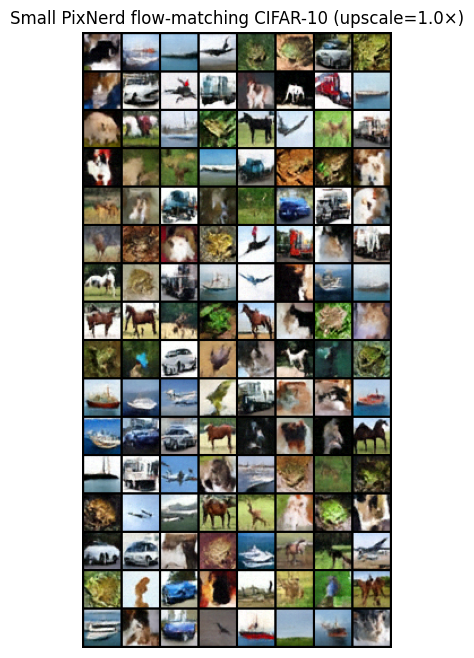

In [15]:
import torch._dynamo as dynamo
from torchvision.utils import make_grid

# ensure models are on GPU after Lightning is done
model.to(DEVICE)
if hasattr(model, "ema_denoiser"):
    model.ema_denoiser.to(DEVICE)
model.vae.to(DEVICE)

# run sampler in eager mode (no Triton/Inductor)
@dynamo.disable
def run_pixnerd_sampling(sampler, net, xT, condition, uncondition):
    return sampler(net, xT, condition, uncondition)

# -------------------------------------------------
# Sampling + SR
# -------------------------------------------------
upscale = 2.0
model.denoiser.decoder_patch_scaling_h = upscale
model.denoiser.decoder_patch_scaling_w = upscale

model.eval()

with torch.no_grad():
    batch = next(iter(val_loader))
    x, y, metadata = batch

    # move to GPU
    x = x.to(DEVICE, non_blocking=True)
    y = torch.as_tensor(y, device=DEVICE)

    # start from Gaussian noise in pixel space
    xT = torch.randn_like(x, device=DEVICE)

    # classifier-free guidance conditioning
    condition, uncondition = model.conditioner(y, metadata)
    condition   = condition.to(DEVICE, non_blocking=True)
    uncondition = uncondition.to(DEVICE, non_blocking=True)

    # use EMA denoiser if available, else fall back to main
    net_for_sampling = getattr(model, "ema_denoiser", model.denoiser).eval()

    samples = run_pixnerd_sampling(
        model.diffusion_sampler,
        net_for_sampling,
        xT,
        condition,
        uncondition,
    )

    # decode with PixelAE; output will be super-res if decoder scaling > 1
    imgs = model.vae.decode(samples).cpu()     # [B,3,H,W], fp32
    imgs_uint8 = fp2uint8(imgs)                # uint8 [0,255]

    grid = make_grid(imgs_uint8, nrow=8)
    plt.figure(figsize=(8, 8))
    plt.axis("off")
    plt.title(f"Small PixNerd flow-matching CIFAR-10 (upscale={upscale}×)")
    plt.imshow(grid.permute(1, 2, 0))
    plt.show()


In [ ]:
import torch._dynamo as dynamo
from torchvision.utils import make_grid

# ensure models are on GPU after Lightning is done
model.to(DEVICE)
if hasattr(model, "ema_denoiser"):
    model.ema_denoiser.to(DEVICE)
model.vae.to(DEVICE)

# run sampler in eager mode (no Triton/Inductor)
@dynamo.disable
def run_pixnerd_sampling(sampler, net, xT, condition, uncondition):
    return sampler(net, xT, condition, uncondition)

# -------------------------------------------------
# Sampling + SR
# -------------------------------------------------
upscale = 8.0
model.denoiser.decoder_patch_scaling_h = upscale
model.denoiser.decoder_patch_scaling_w = upscale

model.eval()

with torch.no_grad():
    batch = next(iter(val_loader))
    x, y, metadata = batch

    # move to GPU
    x = x.to(DEVICE, non_blocking=True)
    y = torch.as_tensor(y, device=DEVICE)

    # start from Gaussian noise in pixel space
    xT = torch.randn_like(x, device=DEVICE)

    # classifier-free guidance conditioning
    condition, uncondition = model.conditioner(y, metadata)
    condition   = condition.to(DEVICE, non_blocking=True)
    uncondition = uncondition.to(DEVICE, non_blocking=True)

    # use EMA denoiser if available, else fall back to main
    net_for_sampling = getattr(model, "ema_denoiser", model.denoiser).eval()

    samples = run_pixnerd_sampling(
        model.diffusion_sampler,
        net_for_sampling,
        xT,
        condition,
        uncondition,
    )

    # decode with PixelAE; output will be super-res if decoder scaling > 1
    imgs = model.vae.decode(samples).cpu()     # [B,3,H,W], fp32
    imgs_uint8 = fp2uint8(imgs)                # uint8 [0,255]

    grid = make_grid(imgs_uint8, nrow=8)
    plt.figure(figsize=(8, 8))
    plt.axis("off")
    plt.title(f"Small PixNerd flow-matching CIFAR-10 (upscale={upscale}×)")
    plt.imshow(grid.permute(1, 2, 0))
    plt.show()


[rank: 0] Seed set to 42


Device: cuda
ImageNet total size: 539826
Num classes: 1000
Train size: 512834
Val size: 26992


/pscratch/sd/k/kevinval/envs/pixnerd/lib/python3.10/site-packages/lightning/fabric/connector.py:572: `precision=bf16` is supported for historical reasons but its usage is discouraged. Please set your precision to bf16-mixed instead!
Using bfloat16 Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/pscratch/sd/k/kevinval/envs/pixnerd/lib/python3.10/site-packages/lightning/pytorch/callbacks/model_checkpoint.py:654: Checkpoint directory /pscratch/sd/k/kevinval/PixNerd/logs/pixnerd_imagenet128_small/checkpoints exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]


[PixNerd] No last.ckpt found, training from scratch.



  | Name              | Type                  | Params | Mode 
--------------------------------------------------------------------
0 | vae               | PixelAE               | 0      | eval 
1 | conditioner       | LabelTokenConditioner | 1.0 M  | eval 
2 | denoiser          | PixNerDiT             | 544 M  | train
3 | ema_denoiser      | PixNerDiT             | 544 M  | eval 
4 | diffusion_sampler | AdamLMSampler         | 0      | train
5 | diffusion_trainer | REPATrainer           | 2.9 M  | train
--------------------------------------------------------------------
546 M     Trainable params
546 M     Non-trainable params
1.1 B     Total params
4,373.257 Total estimated model params size (MB)
194       Modules in train mode
200       Modules in eval mode
SLURM auto-requeueing enabled. Setting signal handlers.


Epoch 0: 100%|██████████| 16027/16027 [26:55<00:00,  9.92it/s, v_num=1, fm_loss=0.0986, cos_loss=1.14e-5, loss=0.0986]
idation: |          | 0/? [00:00<?, ?it/s]
Epoch 0: 100%|██████████| 16027/16027 [41:27<00:00,  6.44it/s, v_num=1, fm_loss=0.0986, cos_loss=1.14e-5, loss=0.0986]

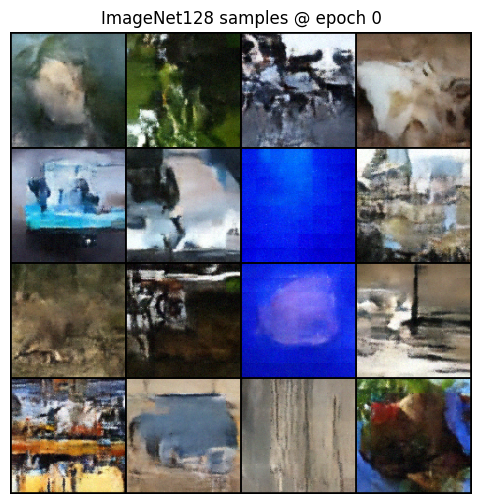

Epoch 1: 100%|██████████| 16027/16027 [26:56<00:00,  9.92it/s, v_num=1, fm_loss=0.0859, cos_loss=1.99e-5, loss=0.0859]
idation: |          | 0/? [00:00<?, ?it/s]
Epoch 1: 100%|██████████| 16027/16027 [41:28<00:00,  6.44it/s, v_num=1, fm_loss=0.0859, cos_loss=1.99e-5, loss=0.0859]

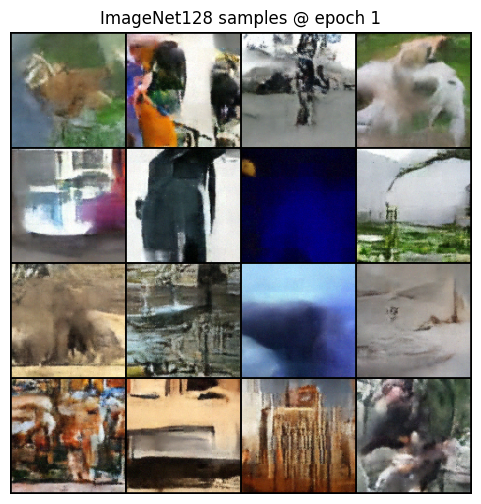

Epoch 2: 100%|██████████| 16027/16027 [27:01<00:00,  9.88it/s, v_num=1, fm_loss=0.114, cos_loss=1.46e-5, loss=0.114]  
idation: |          | 0/? [00:00<?, ?it/s]
Epoch 2: 100%|██████████| 16027/16027 [41:33<00:00,  6.43it/s, v_num=1, fm_loss=0.114, cos_loss=1.46e-5, loss=0.114]

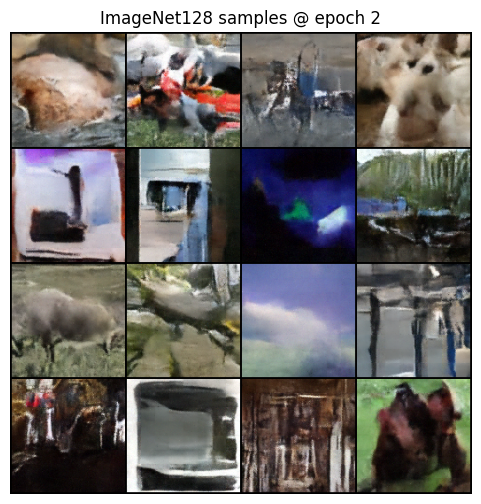

Epoch 3: 100%|██████████| 16027/16027 [27:02<00:00,  9.88it/s, v_num=1, fm_loss=0.107, cos_loss=1.04e-5, loss=0.107]  
idation: |          | 0/? [00:00<?, ?it/s]
Epoch 3: 100%|██████████| 16027/16027 [41:35<00:00,  6.42it/s, v_num=1, fm_loss=0.107, cos_loss=1.04e-5, loss=0.107]

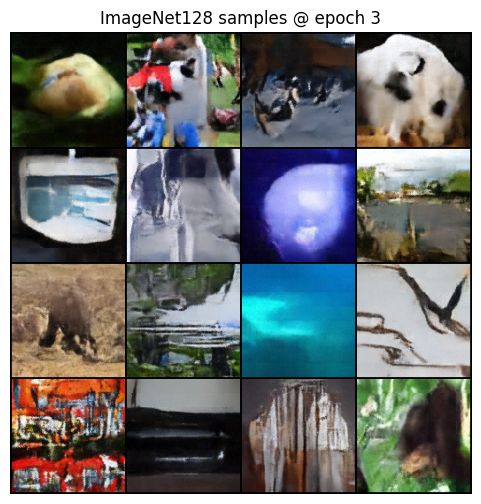

Epoch 4: 100%|██████████| 16027/16027 [27:03<00:00,  9.87it/s, v_num=1, fm_loss=0.101, cos_loss=8.02e-6, loss=0.101]  
idation: |          | 0/? [00:00<?, ?it/s]
Epoch 4: 100%|██████████| 16027/16027 [41:35<00:00,  6.42it/s, v_num=1, fm_loss=0.101, cos_loss=8.02e-6, loss=0.101]

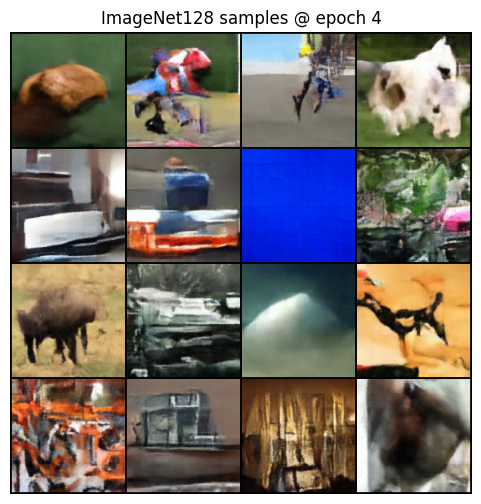

Epoch 5: 100%|██████████| 16027/16027 [27:01<00:00,  9.88it/s, v_num=1, fm_loss=0.127, cos_loss=2.12e-5, loss=0.127]  
idation: |          | 0/? [00:00<?, ?it/s]
Epoch 5: 100%|██████████| 16027/16027 [41:34<00:00,  6.43it/s, v_num=1, fm_loss=0.127, cos_loss=2.12e-5, loss=0.127]

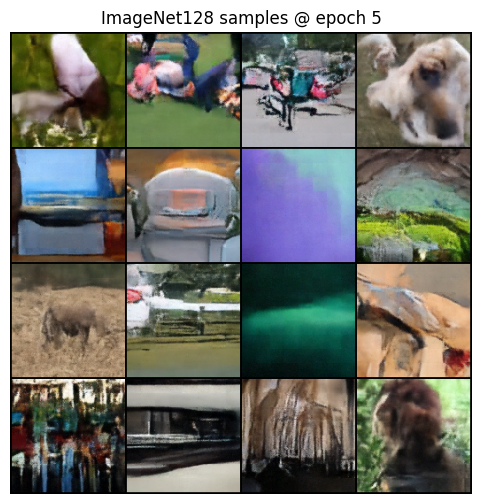

Epoch 6: 100%|██████████| 16027/16027 [27:05<00:00,  9.86it/s, v_num=1, fm_loss=0.120, cos_loss=3.4e-5, loss=0.120]   
idation: |          | 0/? [00:00<?, ?it/s]
Epoch 6: 100%|██████████| 16027/16027 [41:38<00:00,  6.41it/s, v_num=1, fm_loss=0.120, cos_loss=3.4e-5, loss=0.120]

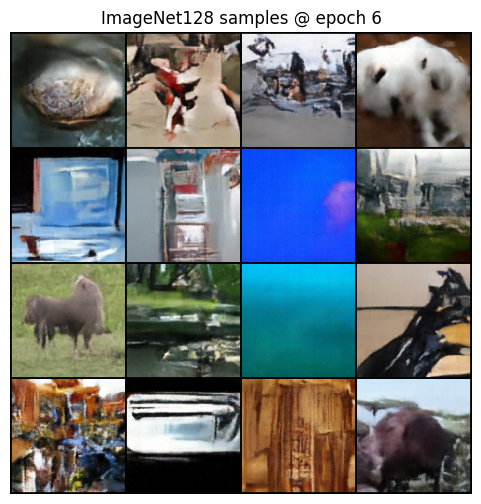

Epoch 7:   1%|          | 165/16027 [00:17<27:48,  9.51it/s, v_num=1, fm_loss=0.103, cos_loss=1.35e-5, loss=0.103]  

In [ ]:
# ============================================================
# PixNerd-style Flow-Matching on ImageNet 128×128
#  - Root: /pscratch/sd/k/kevinval/datasets/imagenet256
#    (class subfolders directly; we random-split train/val)
#  - Train at 128×128
#  - NF super-res to 256×256 (decoder_patch_scaling=2)
#  - Compare vs 128→256 bilinear upsample
# ============================================================

import os, math, random, json, pathlib, itertools

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, random_split

import torchvision
from torchvision import transforms, datasets
from torchvision.utils import make_grid

from PIL import Image
import matplotlib.pyplot as plt

import lightning.pytorch as pl
from lightning.pytorch.callbacks import ModelCheckpoint, Callback
from lightning.pytorch.loggers import CSVLogger

from src.models.autoencoder.pixel import PixelAE
from src.models.transformer.pixnerd_t2i_heavydecoder import PixNerDiT
from src.diffusion.flow_matching.scheduling import LinearScheduler
from src.diffusion.flow_matching.adam_sampling import AdamLMSampler, ode_step_fn
from src.diffusion.base.guidance import simple_guidance_fn
from src.diffusion.flow_matching.training_repa import REPATrainer
from src.callbacks.simple_ema import SimpleEMA
from src.lightning_model import LightningModel
from src.models.autoencoder.base import fp2uint8
from src.models.conditioner.base import BaseConditioner

import torch._dynamo as dynamo

pl.seed_everything(42)
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", DEVICE)

# ============================================================
# Paths and hyperparameters (ImageNet 128×128)
# ============================================================

IMAGENET_ROOT = "/pscratch/sd/k/kevinval/datasets/imagenet256"  # classes/*jpg

BATCH_SIZE    = 32
NUM_WORKERS   = 8
IMAGE_SIZE    = 128
MAX_EPOCHS    = 10
PRECISION     = "bf16" if torch.cuda.is_available() else 32

# Small-ish DiT config for 128×128
HIDDEN_SIZE    = 768
TXT_EMBED_DIM  = 1024
PATCH_SIZE     = 16         # 128/16 -> 8×8 tokens
TXT_MAX_LENGTH = 64
NUM_GROUPS     = 24         # 768 / 24 = 32
PROJ_DIM       = 768

LOG_DIR  = "logs/pixnerd_imagenet128_small"
CKPT_DIR = os.path.join(LOG_DIR, "checkpoints")
os.makedirs(CKPT_DIR, exist_ok=True)

VIS_EVERY_N_EPOCHS = 1
VIS_NUM_SAMPLES    = 16
VIS_UPSCALE        = 1.0    # 128×128 during training

# ============================================================
# ImageNet dataset with metadata (raw + normalized image)
#  - single root with class folders; we random-split train/val
# ============================================================

transform_raw = transforms.Compose([
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
    transforms.ToTensor(),                      # [0,1]
])

transform = transforms.Compose([
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5],  # map to [-1,1]
                         std=[0.5, 0.5, 0.5]),
])

class ImageFolderWithMetadata(datasets.ImageFolder):
    def __init__(self, root, transform_raw, transform):
        super().__init__(root=root)
        self.transform_raw = transform_raw
        self.transform     = transform

    def __getitem__(self, index):
        path, target = self.samples[index]
        img = self.loader(path)  # PIL

        raw_tensor = self.transform_raw(img)   # [3,H,W] in [0,1]
        img_tensor = self.transform(img)       # [-1,1]

        metadata = {"raw_image": raw_tensor}
        return img_tensor, target, metadata

full_dataset = ImageFolderWithMetadata(
    root=IMAGENET_ROOT,
    transform_raw=transform_raw,
    transform=transform,
)

NUM_CLASSES = len(full_dataset.classes)
print("ImageNet total size:", len(full_dataset))
print("Num classes:", NUM_CLASSES)

train_size = int(0.95 * len(full_dataset))
val_size   = len(full_dataset) - train_size
train_dataset, val_dataset = random_split(
    full_dataset,
    [train_size, val_size],
    generator=torch.Generator().manual_seed(42),
)

print("Train size:", len(train_dataset))
print("Val size:",   len(val_dataset))

train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=NUM_WORKERS,
    pin_memory=True,
)

val_loader = DataLoader(
    val_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=True,
)

# fixed batch from val set for vis
vis_batch = next(iter(val_loader))

# ============================================================
# Conditioning: class tokens instead of text
# ============================================================

class LabelTokenConditioner(BaseConditioner):
    def __init__(self, num_classes: int, embed_dim: int, max_length: int = 64):
        super().__init__()
        self.embed = nn.Embedding(num_classes, embed_dim)
        self.max_length = max_length
        self.register_buffer(
            "uncond",
            torch.zeros(1, max_length, embed_dim),
            persistent=False,
        )

    def _impl_condition(self, y, metadata=None):
        tokens = self.embed(y.to(self.embed.weight.device))  # (B, D)
        tokens = tokens.unsqueeze(1)                         # (B, 1, D)
        return tokens.repeat(1, self.max_length, 1)          # (B, L, D)

    def _impl_uncondition(self, y, metadata=None):
        b = y.shape[0]
        return self.uncond.repeat(b, 1, 1)

# ============================================================
# Lightweight vision encoder for REPA feature alignment
# ============================================================

class SimpleVisionEncoder(nn.Module):
    def __init__(self, proj_dim: int):
        super().__init__()
        self.backbone = nn.Sequential(
            nn.Conv2d(3, 64, 3, stride=2, padding=1),   # 128 -> 64
            nn.SiLU(),
            nn.Conv2d(64, 128, 3, stride=2, padding=1), # 64 -> 32
            nn.SiLU(),
            nn.Conv2d(128, 256, 3, stride=2, padding=1),# 32 -> 16
            nn.SiLU(),
            nn.Conv2d(256, 256, 3, stride=2, padding=1),# 16 -> 8
            nn.SiLU(),
            nn.AdaptiveAvgPool2d(1),                    # 8 -> 1
        )
        self.proj = nn.Linear(256, proj_dim)

    def forward(self, x):
        feat = self.backbone(x)          # (B,256,1,1)
        feat = feat.flatten(1)           # (B,256)
        feat = self.proj(feat)           # (B,proj_dim)
        return feat.unsqueeze(1)         # (B,1,proj_dim)

# ============================================================
# Instantiate PixNerDiT + flow-matching trainer + sampler
# ============================================================

main_scheduler = LinearScheduler()

vae = PixelAE(scale=1.0)

conditioner = LabelTokenConditioner(
    num_classes=NUM_CLASSES,
    embed_dim=TXT_EMBED_DIM,
    max_length=TXT_MAX_LENGTH,
)

denoiser = PixNerDiT(
    in_channels=3,
    patch_size=PATCH_SIZE,      # 16 -> 8×8 tokens
    num_groups=NUM_GROUPS,
    hidden_size=HIDDEN_SIZE,
    txt_embed_dim=TXT_EMBED_DIM,
    txt_max_length=TXT_MAX_LENGTH,
    num_text_blocks=2,
    decoder_hidden_size=256,
    num_encoder_blocks=8,
    num_decoder_blocks=2,
)

sampler = AdamLMSampler(
    num_steps=25,
    guidance=3.0,
    timeshift=3.0,
    order=2,
    scheduler=main_scheduler,
    guidance_fn=simple_guidance_fn,
    step_fn=ode_step_fn,
)

trainer_core = REPATrainer(
    scheduler=main_scheduler,
    lognorm_t=True,
    timeshift=4.0,
    feat_loss_weight=0.5,
    encoder=SimpleVisionEncoder(proj_dim=PROJ_DIM),
    align_layer=2,
    proj_denoiser_dim=HIDDEN_SIZE,
    proj_hidden_dim=HIDDEN_SIZE,
    proj_encoder_dim=PROJ_DIM,
)

ema_tracker = SimpleEMA(decay=0.999)

optimizer_fn = lambda params: torch.optim.AdamW(
    params,
    lr=2e-4,
    betas=(0.9, 0.99),
)

model = LightningModel(
    vae=vae,
    conditioner=conditioner,
    denoiser=denoiser,
    diffusion_trainer=trainer_core,
    diffusion_sampler=sampler,
    ema_tracker=ema_tracker,
    optimizer=optimizer_fn,
    lr_scheduler=None,
    eval_original_model=False,
)

# ============================================================
# Callback for periodic visualization at 128×128
# ============================================================

class SampleVisualizationCallback(Callback):
    def __init__(self, vis_batch, every_n_epochs=1, num_samples=16, upscale=1.0):
        super().__init__()
        self.vis_x, self.vis_y, self.vis_metadata = vis_batch
        self.every_n_epochs = every_n_epochs
        self.num_samples = num_samples
        self.upscale = upscale

    def on_train_epoch_end(self, trainer, pl_module):
        if hasattr(trainer, "global_rank") and trainer.global_rank != 0:
            return

        epoch = trainer.current_epoch
        if epoch % self.every_n_epochs != 0:
            return

        pl_module.eval()
        device = next(pl_module.parameters()).device

        with torch.no_grad():
            x = self.vis_x[:self.num_samples].to(device)
            y = torch.as_tensor(self.vis_y[:self.num_samples], device=device)

            metadata = {}
            if isinstance(self.vis_metadata, dict):
                for k, v in self.vis_metadata.items():
                    metadata[k] = v[:self.num_samples].to(device)
            else:
                metadata = self.vis_metadata

            pl_module.denoiser.decoder_patch_scaling_h = self.upscale
            pl_module.denoiser.decoder_patch_scaling_w = self.upscale

            xT = torch.randn_like(x)

            condition, uncondition = pl_module.conditioner(y, metadata)
            condition   = condition.to(device)
            uncondition = uncondition.to(device)

            samples = pl_module.diffusion_sampler(
                pl_module.ema_denoiser,
                xT,
                condition,
                uncondition,
            )

            imgs = pl_module.vae.decode(samples).cpu()
            imgs_uint8 = fp2uint8(imgs)

            nrow = int(math.sqrt(self.num_samples))
            grid = make_grid(imgs_uint8, nrow=nrow)

            plt.figure(figsize=(6, 6))
            plt.axis("off")
            plt.title(f"ImageNet128 samples @ epoch {epoch}")
            plt.imshow(grid.permute(1, 2, 0))
            plt.show()

        pl_module.train()

vis_cb = SampleVisualizationCallback(
    vis_batch=vis_batch,
    every_n_epochs=VIS_EVERY_N_EPOCHS,
    num_samples=VIS_NUM_SAMPLES,
    upscale=VIS_UPSCALE,
)

# ============================================================
# Lightning Trainer
# ============================================================

# ============================================================
# Lightning Trainer + auto-resume from last.ckpt (if present)
# ============================================================

logger = CSVLogger(save_dir=LOG_DIR, name="pixnerd_imagenet128_small")

ckpt_cb = ModelCheckpoint(
    dirpath=CKPT_DIR,
    save_top_k=1,
    save_last=True,  # <-- NEW: also keep a rolling last.ckpt
    monitor="loss",
    mode="min",
    filename="pixnerd_imagenet128-small-{epoch:02d}-{loss:.4f}",
)

# auto-detect last.ckpt
last_ckpt_path = os.path.join(CKPT_DIR, "last.ckpt")
resume_ckpt = last_ckpt_path if os.path.exists(last_ckpt_path) else None

if resume_ckpt is not None:
    print(f"[PixNerd] Found checkpoint, resuming from: {resume_ckpt}")
else:
    print("[PixNerd] No last.ckpt found, training from scratch.")

trainer = pl.Trainer(
    max_epochs=MAX_EPOCHS,   # total epochs; Lightning will continue from current_epoch if resuming
    precision=PRECISION,
    accelerator="gpu" if torch.cuda.is_available() else "cpu",
    devices=1,
    callbacks=[ckpt_cb, vis_cb],
    logger=logger,
)

trainer.fit(
    model,
    train_dataloaders=train_loader,
    val_dataloaders=val_loader,
    ckpt_path=resume_ckpt,   # <-- key: this triggers full resume if not None
)

# ============================================================
# Super-resolution: 128×128 → 256×256 and bilinear compare
# (unchanged below here)
# ============================================================

def set_decoder_scale(m, scale: float):
    if hasattr(m, "decoder_patch_scaling_h"):
        m.decoder_patch_scaling_h = scale
        m.decoder_patch_scaling_w = scale

@dynamo.disable
def run_pixnerd_sampling(sampler, net, xT, condition, uncondition):
    return sampler(net, xT, condition, uncondition)

# move models to device for sampling
model.to(DEVICE)
if hasattr(model, "ema_denoiser"):
    model.ema_denoiser.to(DEVICE)
model.vae.to(DEVICE)

model.eval()
with torch.no_grad():
    batch = next(iter(val_loader))
    x, y, metadata = batch

    x = x.to(DEVICE, non_blocking=True)
    y = torch.as_tensor(y, device=DEVICE)

    xT = torch.randn_like(x, device=DEVICE)

    condition, uncondition = model.conditioner(y, metadata)
    condition   = condition.to(DEVICE, non_blocking=True)
    uncondition = uncondition.to(DEVICE, non_blocking=True)

    net_for_sampling = getattr(model, "ema_denoiser", model.denoiser).eval()

    # -------- base 128×128 sample --------
    set_decoder_scale(model.denoiser, 1.0)
    if hasattr(model, "ema_denoiser"):
        set_decoder_scale(model.ema_denoiser, 1.0)

    samples_128 = run_pixnerd_sampling(
        model.diffusion_sampler,
        net_for_sampling,
        xT,
        condition,
        uncondition,
    )
    imgs_128 = model.vae.decode(samples_128)          # [-1,1]
    imgs_128 = (imgs_128.clamp(-1, 1) + 1) * 0.5      # [0,1]

    # -------- NF super-res 256×256 (scale=2) --------
    set_decoder_scale(model.denoiser, 2.0)
    if hasattr(model, "ema_denoiser"):
        set_decoder_scale(model.ema_denoiser, 2.0)

    samples_256 = run_pixnerd_sampling(
        model.diffusion_sampler,
        net_for_sampling,
        xT,
        condition,
        uncondition,
    )
    imgs_256 = model.vae.decode(samples_256)          # [-1,1]
    imgs_256 = (imgs_256.clamp(-1, 1) + 1) * 0.5      # [0,1]

    # -------- bilinear baseline: 128 → 256 --------
    H, W = imgs_256.shape[-2:]
    imgs_128_up = F.interpolate(imgs_128, size=(H, W),
                                mode="bilinear", align_corners=False)

    N = 4  # show 4 pairs
    base_vis = imgs_128_up[:N]
    sr_vis   = imgs_256[:N]

    pairs = torch.stack([base_vis, sr_vis], dim=1)  # [N,2,3,H,W]
    pairs = pairs.flatten(0, 1)                     # [2N,3,H,W]

    grid = make_grid(pairs, nrow=2)
    plt.figure(figsize=(8, 4))
    plt.axis("off")
    plt.title("Left: 128→256 bilinear  |  Right: NF super-res 256×256")
    plt.imshow(grid.permute(1, 2, 0).cpu())
    plt.show()



[rank: 0] Seed set to 42


Device: cuda
ImageNet total size: 539826
Num classes: 1000
Train size: 512834
Val size: 26992


/pscratch/sd/k/kevinval/envs/pixnerd/lib/python3.10/site-packages/lightning/fabric/connector.py:572: `precision=bf16` is supported for historical reasons but its usage is discouraged. Please set your precision to bf16-mixed instead!
Using bfloat16 Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/pscratch/sd/k/kevinval/envs/pixnerd/lib/python3.10/site-packages/lightning/pytorch/callbacks/model_checkpoint.py:654: Checkpoint directory /pscratch/sd/k/kevinval/PixNerd/logs/pixnerd_imagenet128_small/checkpoints exists and is not empty.
Restoring states from the checkpoint path at logs/pixnerd_imagenet128_small/checkpoints/last.ckpt


[PixNerd] Found checkpoint, resuming from: logs/pixnerd_imagenet128_small/checkpoints/last.ckpt


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]

  | Name              | Type                  | Params | Mode 
--------------------------------------------------------------------
0 | vae               | PixelAE               | 0      | eval 
1 | conditioner       | LabelTokenConditioner | 1.0 M  | eval 
2 | denoiser          | PixNerDiT             | 544 M  | train
3 | ema_denoiser      | PixNerDiT             | 544 M  | eval 
4 | diffusion_sampler | AdamLMSampler         | 0      | train
5 | diffusion_trainer | REPATrainer           | 2.9 M  | train
--------------------------------------------------------------------
546 M     Trainable params
546 M     Non-trainable params
1.1 B     Total params
4,373.257 Total estimated model params size (MB)
194       Modules in train mode
200       Modules in eval mode
Restored all states from the checkpoint at logs/pixnerd_imagenet128_small/checkpoints/last.ckpt
SLURM auto-requeueing enabled. Setting signal handlers.


Epoch 10: 100%|██████████| 16027/16027 [26:50<00:00,  9.95it/s, v_num=4, fm_loss=0.0757, cos_loss=1.22e-5, loss=0.0757]
idation: |          | 0/? [00:00<?, ?it/s]
Epoch 10: 100%|██████████| 16027/16027 [41:21<00:00,  6.46it/s, v_num=4, fm_loss=0.0757, cos_loss=1.22e-5, loss=0.0757]

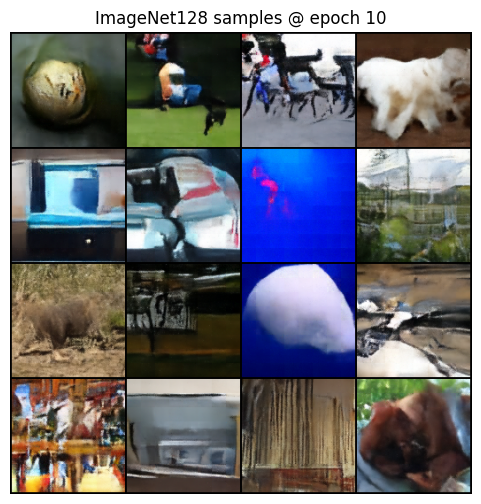

Epoch 11: 100%|██████████| 16027/16027 [26:43<00:00, 10.00it/s, v_num=4, fm_loss=0.112, cos_loss=1.4e-5, loss=0.112]   
idation: |          | 0/? [00:00<?, ?it/s]
Epoch 11: 100%|██████████| 16027/16027 [41:15<00:00,  6.48it/s, v_num=4, fm_loss=0.112, cos_loss=1.4e-5, loss=0.112]

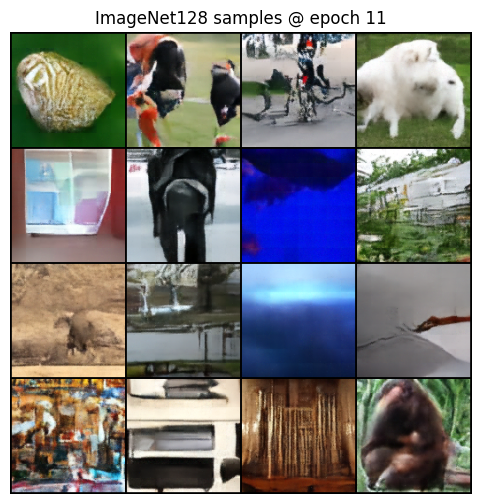

Epoch 11: 100%|██████████| 16027/16027 [41:16<00:00,  6.47it/s, v_num=4, fm_loss=0.112, cos_loss=1.4e-5, loss=0.112]

In [ ]:
# ============================================================
# PixNerd-style Flow-Matching on ImageNet 128×128
#  - Root: /pscratch/sd/k/kevinval/datasets/imagenet256
#    (class subfolders directly; we random-split train/val)
#  - Train at 128×128
#  - NF super-res to 256×256 (decoder_patch_scaling=2)
#  - Compare vs 128→256 bilinear upsample
# ============================================================

import os, math, random, json, pathlib, itertools

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, random_split

import torchvision
from torchvision import transforms, datasets
from torchvision.utils import make_grid

from PIL import Image
import matplotlib.pyplot as plt

import lightning.pytorch as pl
from lightning.pytorch.callbacks import ModelCheckpoint, Callback
from lightning.pytorch.loggers import CSVLogger

from src.models.autoencoder.pixel import PixelAE
from src.models.transformer.pixnerd_t2i_heavydecoder import PixNerDiT
from src.diffusion.flow_matching.scheduling import LinearScheduler
from src.diffusion.flow_matching.adam_sampling import AdamLMSampler, ode_step_fn
from src.diffusion.base.guidance import simple_guidance_fn
from src.diffusion.flow_matching.training_repa import REPATrainer
from src.callbacks.simple_ema import SimpleEMA
from src.lightning_model import LightningModel
from src.models.autoencoder.base import fp2uint8
from src.models.conditioner.base import BaseConditioner

import torch._dynamo as dynamo

pl.seed_everything(42)
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", DEVICE)

# ============================================================
# Paths and hyperparameters (ImageNet 128×128)
# ============================================================

IMAGENET_ROOT = "/pscratch/sd/k/kevinval/datasets/imagenet256"  # classes/*jpg

BATCH_SIZE    = 32
NUM_WORKERS   = 8
IMAGE_SIZE    = 128
MAX_EPOCHS    = 50
PRECISION     = "bf16" if torch.cuda.is_available() else 32

# Small-ish DiT config for 128×128
HIDDEN_SIZE    = 768
TXT_EMBED_DIM  = 1024
PATCH_SIZE     = 16         # 128/16 -> 8×8 tokens
TXT_MAX_LENGTH = 64
NUM_GROUPS     = 24         # 768 / 24 = 32
PROJ_DIM       = 768

LOG_DIR  = "logs/pixnerd_imagenet128_small"
CKPT_DIR = os.path.join(LOG_DIR, "checkpoints")
os.makedirs(CKPT_DIR, exist_ok=True)

VIS_EVERY_N_EPOCHS = 1
VIS_NUM_SAMPLES    = 16
VIS_UPSCALE        = 1.0    # 128×128 during training

# ============================================================
# ImageNet dataset with metadata (raw + normalized image)
#  - single root with class folders; we random-split train/val
# ============================================================

transform_raw = transforms.Compose([
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
    transforms.ToTensor(),                      # [0,1]
])

transform = transforms.Compose([
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5],  # map to [-1,1]
                         std=[0.5, 0.5, 0.5]),
])

class ImageFolderWithMetadata(datasets.ImageFolder):
    def __init__(self, root, transform_raw, transform):
        super().__init__(root=root)
        self.transform_raw = transform_raw
        self.transform     = transform

    def __getitem__(self, index):
        path, target = self.samples[index]
        img = self.loader(path)  # PIL

        raw_tensor = self.transform_raw(img)   # [3,H,W] in [0,1]
        img_tensor = self.transform(img)       # [-1,1]

        metadata = {"raw_image": raw_tensor}
        return img_tensor, target, metadata

full_dataset = ImageFolderWithMetadata(
    root=IMAGENET_ROOT,
    transform_raw=transform_raw,
    transform=transform,
)

NUM_CLASSES = len(full_dataset.classes)
print("ImageNet total size:", len(full_dataset))
print("Num classes:", NUM_CLASSES)

train_size = int(0.95 * len(full_dataset))
val_size   = len(full_dataset) - train_size
train_dataset, val_dataset = random_split(
    full_dataset,
    [train_size, val_size],
    generator=torch.Generator().manual_seed(42),
)

print("Train size:", len(train_dataset))
print("Val size:",   len(val_dataset))

train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=NUM_WORKERS,
    pin_memory=True,
)

val_loader = DataLoader(
    val_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=True,
)

# fixed batch from val set for vis
vis_batch = next(iter(val_loader))

# ============================================================
# Conditioning: class tokens instead of text
# ============================================================

class LabelTokenConditioner(BaseConditioner):
    def __init__(self, num_classes: int, embed_dim: int, max_length: int = 64):
        super().__init__()
        self.embed = nn.Embedding(num_classes, embed_dim)
        self.max_length = max_length
        self.register_buffer(
            "uncond",
            torch.zeros(1, max_length, embed_dim),
            persistent=False,
        )

    def _impl_condition(self, y, metadata=None):
        tokens = self.embed(y.to(self.embed.weight.device))  # (B, D)
        tokens = tokens.unsqueeze(1)                         # (B, 1, D)
        return tokens.repeat(1, self.max_length, 1)          # (B, L, D)

    def _impl_uncondition(self, y, metadata=None):
        b = y.shape[0]
        return self.uncond.repeat(b, 1, 1)

# ============================================================
# Lightweight vision encoder for REPA feature alignment
# ============================================================

class SimpleVisionEncoder(nn.Module):
    def __init__(self, proj_dim: int):
        super().__init__()
        self.backbone = nn.Sequential(
            nn.Conv2d(3, 64, 3, stride=2, padding=1),   # 128 -> 64
            nn.SiLU(),
            nn.Conv2d(64, 128, 3, stride=2, padding=1), # 64 -> 32
            nn.SiLU(),
            nn.Conv2d(128, 256, 3, stride=2, padding=1),# 32 -> 16
            nn.SiLU(),
            nn.Conv2d(256, 256, 3, stride=2, padding=1),# 16 -> 8
            nn.SiLU(),
            nn.AdaptiveAvgPool2d(1),                    # 8 -> 1
        )
        self.proj = nn.Linear(256, proj_dim)

    def forward(self, x):
        feat = self.backbone(x)          # (B,256,1,1)
        feat = feat.flatten(1)           # (B,256)
        feat = self.proj(feat)           # (B,proj_dim)
        return feat.unsqueeze(1)         # (B,1,proj_dim)

# ============================================================
# Instantiate PixNerDiT + flow-matching trainer + sampler
# ============================================================

main_scheduler = LinearScheduler()

vae = PixelAE(scale=1.0)

conditioner = LabelTokenConditioner(
    num_classes=NUM_CLASSES,
    embed_dim=TXT_EMBED_DIM,
    max_length=TXT_MAX_LENGTH,
)

denoiser = PixNerDiT(
    in_channels=3,
    patch_size=PATCH_SIZE,      # 16 -> 8×8 tokens
    num_groups=NUM_GROUPS,
    hidden_size=HIDDEN_SIZE,
    txt_embed_dim=TXT_EMBED_DIM,
    txt_max_length=TXT_MAX_LENGTH,
    num_text_blocks=2,
    decoder_hidden_size=256,
    num_encoder_blocks=8,
    num_decoder_blocks=2,
)

sampler = AdamLMSampler(
    num_steps=25,
    guidance=3.0,
    timeshift=3.0,
    order=2,
    scheduler=main_scheduler,
    guidance_fn=simple_guidance_fn,
    step_fn=ode_step_fn,
)

trainer_core = REPATrainer(
    scheduler=main_scheduler,
    lognorm_t=True,
    timeshift=4.0,
    feat_loss_weight=0.5,
    encoder=SimpleVisionEncoder(proj_dim=PROJ_DIM),
    align_layer=2,
    proj_denoiser_dim=HIDDEN_SIZE,
    proj_hidden_dim=HIDDEN_SIZE,
    proj_encoder_dim=PROJ_DIM,
)

ema_tracker = SimpleEMA(decay=0.999)

optimizer_fn = lambda params: torch.optim.AdamW(
    params,
    lr=2e-4,
    betas=(0.9, 0.99),
)

model = LightningModel(
    vae=vae,
    conditioner=conditioner,
    denoiser=denoiser,
    diffusion_trainer=trainer_core,
    diffusion_sampler=sampler,
    ema_tracker=ema_tracker,
    optimizer=optimizer_fn,
    lr_scheduler=None,
    eval_original_model=False,
)

# ============================================================
# Callback for periodic visualization at 128×128
# ============================================================

class SampleVisualizationCallback(Callback):
    def __init__(self, vis_batch, every_n_epochs=1, num_samples=16, upscale=1.0):
        super().__init__()
        self.vis_x, self.vis_y, self.vis_metadata = vis_batch
        self.every_n_epochs = every_n_epochs
        self.num_samples = num_samples
        self.upscale = upscale

    def on_train_epoch_end(self, trainer, pl_module):
        if hasattr(trainer, "global_rank") and trainer.global_rank != 0:
            return

        epoch = trainer.current_epoch
        if epoch % self.every_n_epochs != 0:
            return

        pl_module.eval()
        device = next(pl_module.parameters()).device

        with torch.no_grad():
            x = self.vis_x[:self.num_samples].to(device)
            y = torch.as_tensor(self.vis_y[:self.num_samples], device=device)

            metadata = {}
            if isinstance(self.vis_metadata, dict):
                for k, v in self.vis_metadata.items():
                    metadata[k] = v[:self.num_samples].to(device)
            else:
                metadata = self.vis_metadata

            pl_module.denoiser.decoder_patch_scaling_h = self.upscale
            pl_module.denoiser.decoder_patch_scaling_w = self.upscale

            xT = torch.randn_like(x)

            condition, uncondition = pl_module.conditioner(y, metadata)
            condition   = condition.to(device)
            uncondition = uncondition.to(device)

            samples = pl_module.diffusion_sampler(
                pl_module.ema_denoiser,
                xT,
                condition,
                uncondition,
            )

            imgs = pl_module.vae.decode(samples).cpu()
            imgs_uint8 = fp2uint8(imgs)

            nrow = int(math.sqrt(self.num_samples))
            grid = make_grid(imgs_uint8, nrow=nrow)

            plt.figure(figsize=(6, 6))
            plt.axis("off")
            plt.title(f"ImageNet128 samples @ epoch {epoch}")
            plt.imshow(grid.permute(1, 2, 0))
            plt.show()

        pl_module.train()

vis_cb = SampleVisualizationCallback(
    vis_batch=vis_batch,
    every_n_epochs=VIS_EVERY_N_EPOCHS,
    num_samples=VIS_NUM_SAMPLES,
    upscale=VIS_UPSCALE,
)

# ============================================================
# Lightning Trainer
# ============================================================

# ============================================================
# Lightning Trainer + auto-resume from last.ckpt (if present)
# ============================================================

logger = CSVLogger(save_dir=LOG_DIR, name="pixnerd_imagenet128_small")

ckpt_cb = ModelCheckpoint(
    dirpath=CKPT_DIR,
    save_top_k=1,
    save_last=True,  # <-- NEW: also keep a rolling last.ckpt
    monitor="loss",
    mode="min",
    filename="pixnerd_imagenet128-small-{epoch:02d}-{loss:.4f}",
)

# auto-detect last.ckpt
last_ckpt_path = os.path.join(CKPT_DIR, "last.ckpt")
resume_ckpt = last_ckpt_path if os.path.exists(last_ckpt_path) else None

if resume_ckpt is not None:
    print(f"[PixNerd] Found checkpoint, resuming from: {resume_ckpt}")
else:
    print("[PixNerd] No last.ckpt found, training from scratch.")

trainer = pl.Trainer(
    max_epochs=MAX_EPOCHS,   # total epochs; Lightning will continue from current_epoch if resuming
    precision=PRECISION,
    accelerator="gpu" if torch.cuda.is_available() else "cpu",
    devices=1,
    callbacks=[ckpt_cb, vis_cb],
    logger=logger,
)

trainer.fit(
    model,
    train_dataloaders=train_loader,
    val_dataloaders=val_loader,
    ckpt_path=resume_ckpt,   # <-- key: this triggers full resume if not None
)

# ============================================================
# Super-resolution: 128×128 → 256×256 and bilinear compare
# (unchanged below here)
# ============================================================

def set_decoder_scale(m, scale: float):
    if hasattr(m, "decoder_patch_scaling_h"):
        m.decoder_patch_scaling_h = scale
        m.decoder_patch_scaling_w = scale

@dynamo.disable
def run_pixnerd_sampling(sampler, net, xT, condition, uncondition):
    return sampler(net, xT, condition, uncondition)

# move models to device for sampling
model.to(DEVICE)
if hasattr(model, "ema_denoiser"):
    model.ema_denoiser.to(DEVICE)
model.vae.to(DEVICE)

model.eval()
with torch.no_grad():
    batch = next(iter(val_loader))
    x, y, metadata = batch

    x = x.to(DEVICE, non_blocking=True)
    y = torch.as_tensor(y, device=DEVICE)

    xT = torch.randn_like(x, device=DEVICE)

    condition, uncondition = model.conditioner(y, metadata)
    condition   = condition.to(DEVICE, non_blocking=True)
    uncondition = uncondition.to(DEVICE, non_blocking=True)

    net_for_sampling = getattr(model, "ema_denoiser", model.denoiser).eval()

    # -------- base 128×128 sample --------
    set_decoder_scale(model.denoiser, 1.0)
    if hasattr(model, "ema_denoiser"):
        set_decoder_scale(model.ema_denoiser, 1.0)

    samples_128 = run_pixnerd_sampling(
        model.diffusion_sampler,
        net_for_sampling,
        xT,
        condition,
        uncondition,
    )
    imgs_128 = model.vae.decode(samples_128)          # [-1,1]
    imgs_128 = (imgs_128.clamp(-1, 1) + 1) * 0.5      # [0,1]

    # -------- NF super-res 256×256 (scale=2) --------
    set_decoder_scale(model.denoiser, 2.0)
    if hasattr(model, "ema_denoiser"):
        set_decoder_scale(model.ema_denoiser, 2.0)

    samples_256 = run_pixnerd_sampling(
        model.diffusion_sampler,
        net_for_sampling,
        xT,
        condition,
        uncondition,
    )
    imgs_256 = model.vae.decode(samples_256)          # [-1,1]
    imgs_256 = (imgs_256.clamp(-1, 1) + 1) * 0.5      # [0,1]

    # -------- bilinear baseline: 128 → 256 --------
    H, W = imgs_256.shape[-2:]
    imgs_128_up = F.interpolate(imgs_128, size=(H, W),
                                mode="bilinear", align_corners=False)

    N = 4  # show 4 pairs
    base_vis = imgs_128_up[:N]
    sr_vis   = imgs_256[:N]

    pairs = torch.stack([base_vis, sr_vis], dim=1)  # [N,2,3,H,W]
    pairs = pairs.flatten(0, 1)                     # [2N,3,H,W]

    grid = make_grid(pairs, nrow=2)
    plt.figure(figsize=(8, 4))
    plt.axis("off")
    plt.title("Left: 128→256 bilinear  |  Right: NF super-res 256×256")
    plt.imshow(grid.permute(1, 2, 0).cpu())
    plt.show()



Checkpoint dir: logs/pixnerd_imagenet128_small/checkpoints
Chosen checkpoint: logs/pixnerd_imagenet128_small/checkpoints/last.ckpt


/tmp/ipykernel_2279863/2032795216.py:41: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(ckpt_path, map_location=DEVICE)


Loaded ckpt. Missing keys: 11, unexpected: 0


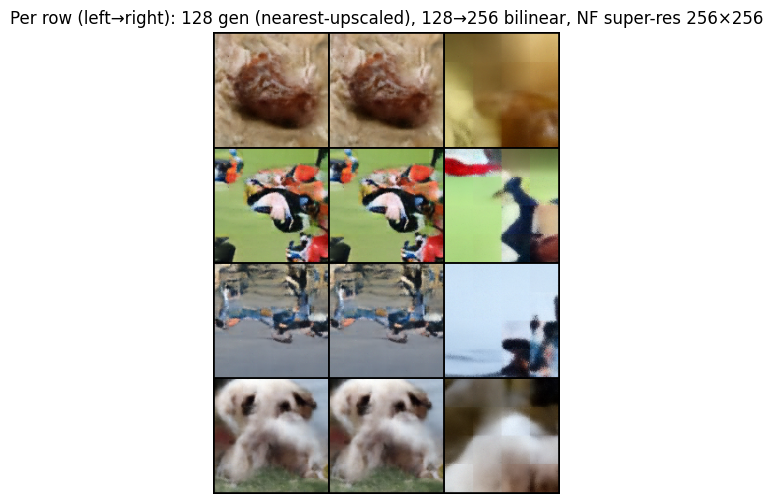

In [5]:
# ============================================================
# Super-res visualization from latest checkpoint
#  - Loads last.ckpt (or best) into `model`
#  - Shows, per sample:
#       1) original 128×128 gen (nearest up to 256)
#       2) 128→256 bilinear
#       3) NF super-res 256×256
# ============================================================

import os
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
from torchvision.utils import make_grid
import torch._dynamo as dynamo

# -------- helper: choose checkpoint --------
def get_latest_ckpt(ckpt_dir):
    last_ckpt = os.path.join(ckpt_dir, "last.ckpt")
    if os.path.exists(last_ckpt):
        return last_ckpt

    # fall back to "best" (first non-last .ckpt)
    candidates = [
        os.path.join(ckpt_dir, f)
        for f in os.listdir(ckpt_dir)
        if f.endswith(".ckpt") and "last" not in f
    ]
    if not candidates:
        return None
    return sorted(candidates)[0]

ckpt_path = get_latest_ckpt(CKPT_DIR)
print("Checkpoint dir:", CKPT_DIR)
print("Chosen checkpoint:", ckpt_path)

if ckpt_path is None:
    print("No checkpoint found — run training first.")
else:
    # -------- load weights into existing `model` --------
    state = torch.load(ckpt_path, map_location=DEVICE)
    missing, unexpected = model.load_state_dict(state["state_dict"], strict=False)
    print(f"Loaded ckpt. Missing keys: {len(missing)}, unexpected: {len(unexpected)}")

    model.to(DEVICE)
    if hasattr(model, "ema_denoiser"):
        model.ema_denoiser.to(DEVICE)
    model.vae.to(DEVICE)

    # -------- helpers for sampling --------
    def set_decoder_scale(net, scale: float):
        if hasattr(net, "decoder_patch_scaling_h"):
            net.decoder_patch_scaling_h = scale
            net.decoder_patch_scaling_w = scale

    @dynamo.disable
    def run_pixnerd_sampling(sampler, net, xT, condition, uncondition):
        return sampler(net, xT, condition, uncondition)

    # -------- sampling + SR compare --------
    model.eval()
    with torch.no_grad():
        batch = next(iter(val_loader))
        x, y, metadata = batch

        x = x.to(DEVICE, non_blocking=True)
        y = torch.as_tensor(y, device=DEVICE)

        # same starting noise for both runs
        xT = torch.randn_like(x, device=DEVICE)

        condition, uncondition = model.conditioner(y, metadata)
        condition   = condition.to(DEVICE, non_blocking=True)
        uncondition = uncondition.to(DEVICE, non_blocking=True)

        net_for_sampling = getattr(model, "ema_denoiser", model.denoiser).eval()

        # -------- base 128×128 sample --------
        set_decoder_scale(model.denoiser, 1.0)
        if hasattr(model, "ema_denoiser"):
            set_decoder_scale(model.ema_denoiser, 1.0)

        samples_128 = run_pixnerd_sampling(
            model.diffusion_sampler,
            net_for_sampling,
            xT,
            condition,
            uncondition,
        )
        imgs_128 = model.vae.decode(samples_128)      # [-1,1]
        imgs_128 = (imgs_128.clamp(-1, 1) + 1) * 0.5  # [0,1], [B,3,128,128]

        # -------- NF super-res 256×256 (scale=2) --------
        set_decoder_scale(model.denoiser, 2.0)
        if hasattr(model, "ema_denoiser"):
            set_decoder_scale(model.ema_denoiser, 2.0)

        samples_256 = run_pixnerd_sampling(
            model.diffusion_sampler,
            net_for_sampling,
            xT,
            condition,
            uncondition,
        )
        imgs_256 = model.vae.decode(samples_256)      # [-1,1]
        imgs_256 = (imgs_256.clamp(-1, 1) + 1) * 0.5  # [0,1], [B,3,256,256]

        # -------- resize original 128 to 256 in two ways ----------
        H, W = imgs_256.shape[-2:]
        # (1) nearest: keeps blocky 128 structure, just zoomed in
        imgs_128_nearest = F.interpolate(
            imgs_128,
            size=(H, W),
            mode="nearest",
        )
        # (2) bilinear: standard smooth upsample
        imgs_128_bilinear = F.interpolate(
            imgs_128,
            size=(H, W),
            mode="bilinear",
            align_corners=False,
        )

        # -------- build triplets: [orig(128→256 nn), bilinear, NF-SR] --------
        N = 4  # number of images to show
        orig_vis = imgs_128_nearest[:N]
        bilin_vis = imgs_128_bilinear[:N]
        sr_vis = imgs_256[:N]

        # shape: [N, 3, 3, H, W] -> [3N, 3, H, W]
        triplets = torch.stack([orig_vis, bilin_vis, sr_vis], dim=1)
        triplets = triplets.flatten(0, 1)

        grid = make_grid(triplets, nrow=3)
        plt.figure(figsize=(9, 3 * N / 2))
        plt.axis("off")
        plt.title(
            "Per row (left→right): "
            "128 gen (nearest-upscaled), 128→256 bilinear, NF super-res 256×256"
        )
        plt.imshow(grid.permute(1, 2, 0).cpu())
        plt.show()
